In [2]:
import os
import copy
#import sfaira
import torch
import numpy as np
import pandas as pd
import scanpy as sc
import numpy as np
import anndata as ad
import scarches as sca
import matplotlib.pyplot as plt
import seaborn as sns

import hnoca.map as mapping

from scarches.models.scpoli import scPoli

/hpc/pmc_rios/2.personal/rariese/miniconda/envs/scanpy/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
2024-11-30 19:58:41.762987: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-11-30 19:58:41.806369: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-11-30 19:58:41.823520: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-11-30 19:58:44.238652: W tensorflow/compiler/tf2tensorrt/utils/py_utils

In [3]:
#anndata2ri.activate()
sc.set_figure_params(figsize=(6, 6), frameon=False, dpi=150)
sns.set_theme()
torch.set_float32_matmul_precision("high")

In [4]:
# kwargs for model traineing

early_stopping_kwargs = {
    "early_stopping_metric": "val_prototype_loss",
    "mode": "min",
    "threshold": 0,
    "patience": 20,
    "reduce_lr": True,
    "lr_patience": 13,
    "lr_factor": 0.1,
}

In [5]:
# functions

def subset_and_pad_adata(gene_set, adata):
    """
    This function uses a gene list provided as a Pandas dataframe with gene symbols and
    Ensembl IDs and subsets a larger Anndata object to only the genes in this list. If
    Not all genes are found in the AnnData object, then zero-padding is performed.
    """
    # Example inputs:
    # genes_filename = '/storage/groups/ml01/workspace/hlca_lisa.sikkema_malte.luecken/genes_for_mapping.csv'
    # data_filename = '/storage/groups/ml01/workspace/hlca_lisa.sikkema_malte.luecken/ready/adams.h5ad'
    # gene_set = pd.read_csv(genes_filename)
    # adata = sc.read(data_filename)

    # Prep objects
    if 'gene_symbol' in gene_set.columns:
        gene_set.index = gene_set['gene_symbol']

    else:
        raise ValueError('The input gene list was not of the expected type!\n'
                         'Gene symbols and ensembl IDs are expected in column names:\n'
                         '\t`gene_symbols` and `Unnamed: 0`')

    # Subset adata object
    common_genes = [gene for gene in gene_set['gene_symbol'].values if gene in adata.var_names]
    if len(common_genes) == 0:
        print("WARNING: YOU SHOULD PROBABLY SWITCH YOUR ADATA.VAR INDEX COLUMN TO GENE NAMES"
                  " RATHER THAN IDS! No genes were recovered.")
        return

    adata_sub = adata[:,common_genes].copy()

    # Pad object with 0 genes if needed
    if len(common_genes) < len(gene_set):
        diff = len(gene_set) - len(common_genes)
        print(f'not all genes were recovered, filling in 0 counts for {diff} missing genes...')
        
        # Genes to pad with
        genes_to_add = set(gene_set['gene_symbol'].values).difference(set(adata_sub.var_names))
        genes_to_add = list(genes_to_add)
        new_var = gene_set.loc[genes_to_add]
        
        if 'Unnamed: 0' in new_var.columns:
            # Assumes the unnamed column are ensembl values
            new_var['ensembl'] = new_var['Unnamed: 0']
            del new_var['Unnamed: 0']

        df_padding = pd.DataFrame(data=np.zeros((adata_sub.shape[0],len(genes_to_add))), index=adata_sub.obs_names, columns=new_var.index)
        adata_padding = sc.AnnData(df_padding, var=new_var)
        
        # Concatenate object
        adata_sub = ad.concat([adata_sub, adata_padding], axis=1, join='inner', index_unique=None, merge='unique')
        
    return adata_sub

In [6]:
scpoli_model_path ="/hpc/pmc_rios/2.personal/rariese/scseq_analysis/BRO/time_course/data/HNOCA/models/ref_scpoli"
mapper_path ="/hpc/pmc_rios/2.personal/rariese/scseq_analysis/BRO/time_course/data/HNOCA/models/query_scpoli_100_epochs" 
ref_adata_path="/hpc/pmc_rios/2.personal/rariese/scseq_analysis/BRO/time_course/data/HNOCA/hnoca_allmeta.h5ad"
ref_adata_hvg_path="/hpc/pmc_rios/2.personal/rariese/scseq_analysis/BRO/time_course/data/HNOCA/hnoca_3k_hvg.h5ad"
query_adata_path ="/hpc/pmc_rios/2.personal/rariese/scseq_analysis/BRO/time_course/data/BRO_timecourse/BRO_RA1_exp023_annotated_integrated_final.h5ad"

In [7]:
ref_adata = sc.read_h5ad(ref_adata_path)

In [8]:
ref_adata = ref_adata[ref_adata.obs['annot_level_2'] == 'Non-telencephalic Neuron']

In [9]:
ref_adata

View of AnnData object with n_obs × n_vars = 226566 × 36842
    obs: 'assay_differentiation', 'assay_sc', 'assay_sc_original', 'assay_type_differentiation', 'bio_sample', 'cell_line', 'cell_line_original', 'cell_type', 'cell_type_original', 'development_stage', 'development_stage_original', 'disease', 'disease_original', 'ethnicity', 'ethnicity_original', 'gm', 'id', 'individual', 'organ', 'organ_original', 'organism', 'organism_original', 'sample_source', 'sex', 'sex_original', 'source_doi', 'state_exact', 'suspension_type', 'suspension_type_original', 'tech_sample', 'treatment', 'obs_names_original', 'organoid_age_days', 'organoid_age_weeks', 'organoid_age_months', 'publication', 'publication_protocol', 'doi', 'batch', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'leiden_pca_unintegrated_1', 'leiden_pca_unintegrated_80', 'leiden_pca_rss_1', 'leiden_pca_rss_80', 'snapseed_pca_unintegr

In [10]:
ref_adata.var_names_make_unique()
ref_adata.uns['log1p']['base'] = None
sc.pp.highly_variable_genes(ref_adata, n_top_genes = 2000, flavor='seurat', batch_key = 'publication')
ref_adata_hvg = ref_adata[:,ref_adata.var.highly_variable]

In [11]:
ref_adata_hvg = ref_adata[:,ref_adata.var.highly_variable]

In [12]:
ref_adata_hvg.obs['batch'] = ref_adata_hvg.obs['publication']

In [13]:
ref_genes = ref_adata_hvg.var.iloc[:,0:2].copy()
ref_genes

,ensembl,gene_symbol
TNMD,ENSG00000000005,TNMD
CFH,ENSG00000000971,CFH
HS3ST1,ENSG00000002587,HS3ST1
TMEM176A,ENSG00000002933,TMEM176A
KLHL13,ENSG00000003096,KLHL13
...,...,...
PCDH20,ENSG00000280165,PCDH20
KCNIP4-IT1,ENSG00000280650,KCNIP4-IT1
LINC00581,ENSG00000280989,LINC00581
IQCJ-SCHIP1,ENSG00000283154,IQCJ-SCHIP1


In [14]:
scpoli_model_123 = scPoli(
    adata=ref_adata_hvg,
    unknown_ct_names=["unknown"],
    condition_keys="batch",
    cell_type_keys=["snapseed_pca_unintegrated_level_1","snapseed_pca_rss_level_12","snapseed_pca_rss_level_123"],
    embedding_dims=10,
    hidden_layer_sizes=[512]
)

Embedding dictionary:
 	Num conditions: [26]
 	Embedding dim: [10]
Encoder Architecture:
	Input Layer in, out and cond: 2000 512 10
	Mean/Var Layer in/out: 512 10
Decoder Architecture:
	First Layer in, out and cond:  10 512 10
	Output Layer in/out:  512 2000 



In [15]:
scpoli_model_123.train(
    n_epochs=10,
    pretraining_epochs=8,
    early_stopping_kwargs=early_stopping_kwargs,
    eta=10,
    alpha_epoch_anneal=100
)

INFO:scarches.trainers.scpoli.trainer:GPU available: True, GPU used: True


Initializing dataloaders
Starting training
 |████████████████----| 80.0%  - val_loss: 1098.00 - val_cvae_loss: 1098.00
Initializing unlabeled prototypes with Leiden with an unknown number of  clusters.
Clustering succesful. Found 54 clusters.
 |████████████████████| 100.0%  - val_loss: 1152.80 - val_cvae_loss: 1110.49 - val_prototype_loss:   42.31 - val_unlabeled_loss:    1.03 - val_labeled_loss:    4.23


### Loading timecourse data

Prepare and match the feature space to the reference model

In [16]:
query_adata = sc.read_h5ad(query_adata_path)
query_adata

AnnData object with n_obs × n_vars = 55327 × 23409
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mito', 'percent.ribo', 'nCount_SCT', 'nFeature_SCT', 'singlets', 'Day', 'n_counts', 'log_counts', 'n_genes', 'mt_fraction', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'leiden', 'leiden_res_1', 'leiden_res_2', 'leiden_res_3', 'leiden_res_4', 'S_score', 'G2M_score', 'phase', 'leiden_diffmap_res_4', 'snapseed_level_1', 'snapseed_level_2', 'snapseed_level_3', 'snapseed_level_4', 'snapseed_level_5', 'leiden_res_0.5', 'hnoca_level_1', 'hnoca_level_1_score', 'hnoca_level_1_logscore', 'hnoca_level_2', 'hnoca_level_2_score', 'hnoca_level_2_logscore', 'hnoca_level_3', 'hnoca_level_3_score', 'hnoca_level_3_logscore', 'hnoca_level_4', 'hnoca_level_4_score', 'hnoca_level_4_logscore', 'hdbca

In [17]:
del query_adata.obsm['X_diffmap']
query_adata.X = query_adata.layers['counts'].copy()

In [18]:
query_adata = query_adata[query_adata.obs['final_annot_level_1'].isin(["Neuron"])]

In [19]:
query_adata_hvg = subset_and_pad_adata(gene_set=ref_genes, adata=query_adata)

not all genes were recovered, filling in 0 counts for 23 missing genes...


In [20]:
query_adata_hvg.var_names_make_unique()

In [21]:
query_adata_hvg

AnnData object with n_obs × n_vars = 4546 × 2000
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mito', 'percent.ribo', 'nCount_SCT', 'nFeature_SCT', 'singlets', 'Day', 'n_counts', 'log_counts', 'n_genes', 'mt_fraction', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'leiden', 'leiden_res_1', 'leiden_res_2', 'leiden_res_3', 'leiden_res_4', 'S_score', 'G2M_score', 'phase', 'leiden_diffmap_res_4', 'snapseed_level_1', 'snapseed_level_2', 'snapseed_level_3', 'snapseed_level_4', 'snapseed_level_5', 'leiden_res_0.5', 'hnoca_level_1', 'hnoca_level_1_score', 'hnoca_level_1_logscore', 'hnoca_level_2', 'hnoca_level_2_score', 'hnoca_level_2_logscore', 'hnoca_level_3', 'hnoca_level_3_score', 'hnoca_level_3_logscore', 'hnoca_level_4', 'hnoca_level_4_score', 'hnoca_level_4_logscore', 'hdbca_l

In [22]:
query_adata_hvg.obs["batch"] = query_adata_hvg.obs["Day"]

In [23]:
query_adata_hvg.obs["annot_ntt_rev2"] = "unknown"
query_adata_hvg.obs["annot_region_rev2"] = "unknown"
query_adata_hvg.obs["annot_level_4_rev2"] = "unknown"

Load the pretrained model and sdd our query to the scPoli model

In [24]:
mapper = mapping.AtlasMapper(scpoli_model_123)

In [25]:
mapper.map_query(
    query_adata_hvg,
    retrain="partial",
    max_epochs=100,
    batch_size=256,
    unlabeled_prototype_training=False,
    n_epochs=100,
    pretraining_epochs=90,
    early_stopping_kwargs=early_stopping_kwargs,
    eta=10,
    alpha_epoch_anneal=10,
)

INFO:scarches.trainers.scpoli.trainer:GPU available: True, GPU used: True


Embedding dictionary:
 	Num conditions: [33]
 	Embedding dim: [10]
Encoder Architecture:
	Input Layer in, out and cond: 2000 512 10
	Mean/Var Layer in/out: 512 10
Decoder Architecture:
	First Layer in, out and cond:  10 512 10
	Output Layer in/out:  512 2000 

Initializing dataloaders
Starting training
 |█-------------------| 8.0%  - val_loss: 1426.96 - val_cvae_loss: 1426.96

 |████████████████████| 100.0%  - val_loss: 1288.38 - val_cvae_loss: 1288.38 - val_prototype_loss:    0.00 - val_unlabeled_loss:    0.00


In [26]:
mapper.compute_wknn(k=100)

Info: GPU detected and cuml installed. Use cuML for neighborhood estimation.
Info: GPU detected and cuml installed. Use cuML for neighborhood estimation.
Info: Computing shared neighbors
Info: Computing weighted neighbors


In [27]:
sc.pp.neighbors(mapper.query_adata, use_rep = "X_latent", key_added="knn_hnocatools")
sc.tl.umap(mapper.query_adata, neighbors_key="knn_hnocatools")

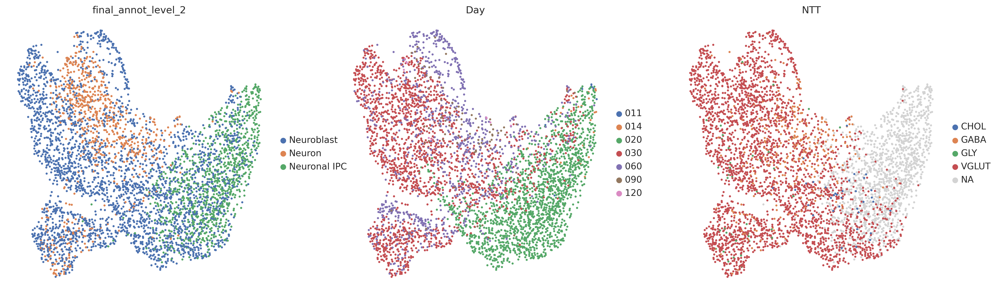

In [28]:
sc.pl.umap(mapper.query_adata, color=["final_annot_level_2",'Day',"NTT"])

In [29]:
def transfer_labels(ref_adata, query_adata, wknn, label_key="celltype"):
    # Generate the scores DataFrame
    scores = pd.DataFrame(
        wknn @ pd.get_dummies(ref_adata.obs[label_key]),
        columns=pd.get_dummies(ref_adata.obs[label_key]).columns,
        index=query_adata.obs_names,
    )
    
    # Add best_label and best_score columns
    scores["best_score"] = scores.max(1)
    scores["best_label"] = scores.idxmax(1)
    
    return scores


In [30]:
annot_level_3_transfer = transfer_labels(ref_adata=mapper.ref_adata, query_adata=mapper.query_adata, wknn=mapper.wknn, label_key="annot_level_3_rev2")
annot_level_3_transfer[["best_label", "best_score"]]

,best_label,best_score
d011_AAGGATGCATAGGTAC-1,Medulla Neuron,1.412494
d011_ACCAAGTCATAACGAC-1,Medulla Neuron,1.754214
d011_ACGCTTGGTTAGTACC-1,Medulla Neuron,1.273983
d011_CTTCGTTAGTTAGCGC-1,Medulla Neuron,1.367595
d011_GCACCATAGCGACTTA-1,Medulla Neuron,1.722384
...,...,...
d120_GTGAATCCATTAACGA-1,Hypothalamic Neuron,1.228585
d120_GTGGAACGTTCCAGTG-1,Dorsal Midbrain Neuron,0.670311
d120_GTTAATGCACATGCCT-1,Medulla Neuron,0.307426
d120_TCAAAGCCACAGCAGC-1,Medulla Neuron,0.380546


In [31]:
annot_level_4_transfer = transfer_labels(ref_adata=mapper.ref_adata, query_adata=mapper.query_adata, wknn=mapper.wknn, label_key="annot_level_4_rev2")
annot_level_4_transfer[["best_label", "best_score"]]

,best_label,best_score
d011_AAGGATGCATAGGTAC-1,Medulla Neuron NT-VGLUT,1.105028
d011_ACCAAGTCATAACGAC-1,Medulla Neuron NT-VGLUT,1.422827
d011_ACGCTTGGTTAGTACC-1,Medulla Neuron NT-VGLUT,1.006166
d011_CTTCGTTAGTTAGCGC-1,Medulla Neuron NT-VGLUT,0.977707
d011_GCACCATAGCGACTTA-1,Medulla Neuron NT-VGLUT,1.328783
...,...,...
d120_GTGAATCCATTAACGA-1,Hypothalamic Neuron NT-GABA,1.038909
d120_GTGGAACGTTCCAGTG-1,Dorsal Midbrain Neuron NT-VGLUT,0.652815
d120_GTTAATGCACATGCCT-1,Medulla Neuron NT-GABA,0.155712
d120_TCAAAGCCACAGCAGC-1,Medulla Neuron NT-VGLUT,0.217564


In [32]:
ntt_transfer = transfer_labels(ref_adata=mapper.ref_adata, query_adata=mapper.query_adata, wknn=mapper.wknn, label_key="annot_ntt_rev2")
ntt_transfer[["best_label", "best_score"]]

,best_label,best_score
d011_AAGGATGCATAGGTAC-1,NT-VGLUT,2.181295
d011_ACCAAGTCATAACGAC-1,NT-VGLUT,4.102335
d011_ACGCTTGGTTAGTACC-1,NT-VGLUT,1.658771
d011_CTTCGTTAGTTAGCGC-1,NT-VGLUT,2.476117
d011_GCACCATAGCGACTTA-1,NT-VGLUT,3.508808
...,...,...
d120_GTGAATCCATTAACGA-1,NT-GABA,1.470199
d120_GTGGAACGTTCCAGTG-1,NT-VGLUT,3.072597
d120_GTTAATGCACATGCCT-1,NT-GABA,0.255960
d120_TCAAAGCCACAGCAGC-1,NT-VGLUT,0.343129


In [33]:
region_transfer = transfer_labels(ref_adata=mapper.ref_adata, query_adata=mapper.query_adata, wknn=mapper.wknn, label_key="annot_region_rev2")
region_transfer[["best_label", "best_score"]]

,best_label,best_score
d011_AAGGATGCATAGGTAC-1,Medulla,1.412494
d011_ACCAAGTCATAACGAC-1,Medulla,1.754214
d011_ACGCTTGGTTAGTACC-1,Medulla,1.273983
d011_CTTCGTTAGTTAGCGC-1,Medulla,1.367595
d011_GCACCATAGCGACTTA-1,Medulla,1.722384
...,...,...
d120_GTGAATCCATTAACGA-1,Hypothalamus,1.228585
d120_GTGGAACGTTCCAGTG-1,Dorsal midbrain,0.670311
d120_GTTAATGCACATGCCT-1,Medulla,0.307426
d120_TCAAAGCCACAGCAGC-1,Medulla,0.380546


In [34]:
mapper.query_adata.obsm['X_latent'].shape

(4546, 10)

In [35]:
query_adata.obsm['X_latent'] = mapper.query_adata.obsm['X_latent'].copy()

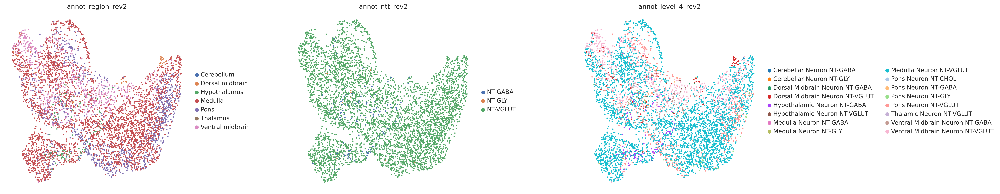

In [36]:
query_adata.obs["annot_level_3_rev2"] = annot_level_3_transfer["best_label"]
query_adata.obs["annot_level_4_rev2"] = annot_level_4_transfer["best_label"]
query_adata.obs["annot_ntt_rev2"] = ntt_transfer["best_label"]
query_adata.obs["annot_region_rev2"] = region_transfer["best_label"]

sc.pp.neighbors(query_adata, use_rep="X_latent")
sc.tl.umap(query_adata)
sc.pl.umap(query_adata, color=["annot_region_rev2", "annot_ntt_rev2", "annot_level_4_rev2"], wspace=0.4)

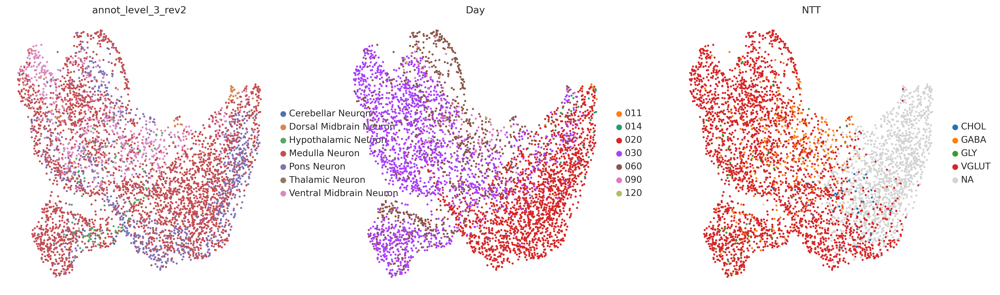

In [37]:
sc.pl.umap(query_adata, color=["annot_level_3_rev2","Day","NTT"])

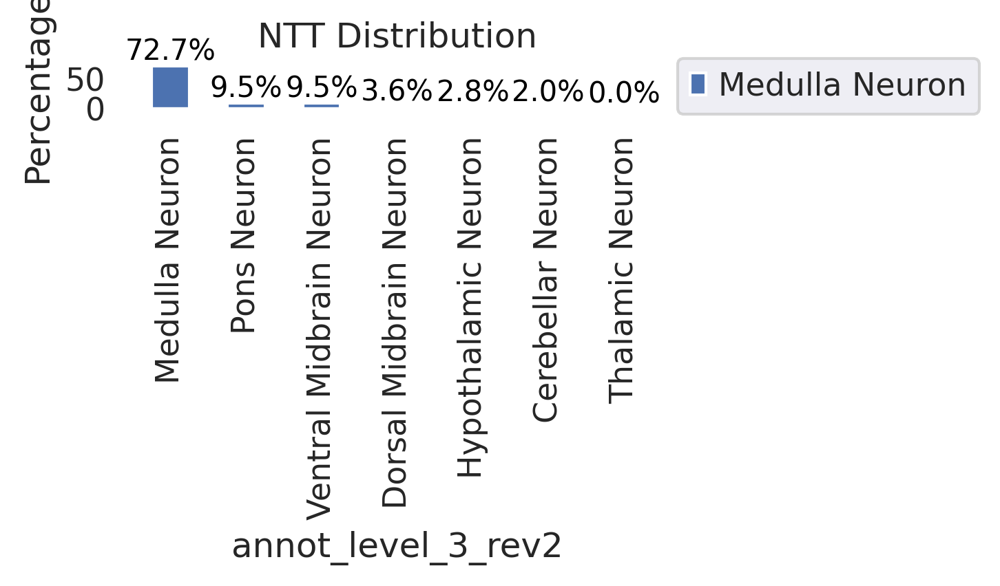

In [198]:
# Drop missing values and calculate value percentages
ntt_percentages = query_adata.obs['annot_level_3_rev2'].dropna().value_counts(normalize=True) * 100

# Create the bar plot
fig, ax = plt.subplots()
ntt_percentages.plot.bar(ax=ax)

# Add percentage labels to each bar
for p in ax.patches:
    ax.annotate(f'{p.get_height():.1f}%', 
                (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha='center', va='center', fontsize=10, color='black', 
                xytext=(0, 5), textcoords='offset points')

# Remove background and spines for a clean look
fig.patch.set_alpha(0)  # Transparent figure background
ax.set_facecolor('none')  # Transparent axes background
ax.grid(False)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# Customize the legend
plt.legend(ntt_percentages.index, loc='center left', bbox_to_anchor=(1, 0.5))
plt.ylabel('Percentage')
plt.title('NTT Distribution')

# Tight layout for cleaner display
plt.tight_layout()
#plt.savefig(f'{fig_dir}BRO_RA1_exp023_NTT_barplot.pdf', bbox_inches='tight', dpi=300)
plt.show()

In [38]:
query_adata.X = query_adata.layers['logcounts'].copy()

In [46]:
def calculate_coexpression_score(adata, gene_list, score_name='co_expression_score', method='geometric_mean'):
    """
    Calculate a co-expression score for a given list of genes in an AnnData object.
    The score can use different methods to calculate the co-expression.
    
    Parameters:
    - adata: AnnData object with gene expression data (adata.X as the expression matrix)
    - gene_list: List of gene names to calculate the co-expression score for
    - score_name: Name for the new column in adata.obs to store the co-expression score (default: 'co_expression_score')
    - method: Method for scoring: 'geometric_mean' or 'sum'. 'geometric_mean' considers all expression levels.
    
    Returns:
    - adata: AnnData object with the co-expression score added to adata.obs
    """
    from scipy.stats import gmean

    # Ensure the genes are in the dataset
    gene_list = [gene for gene in gene_list if gene in adata.var_names]
    if len(gene_list) == 0:
        raise ValueError("None of the specified genes are present in the AnnData object.")
    
    # Subset the expression matrix for the selected genes
    expr_matrix = adata[:, gene_list].X

    # Convert sparse matrix to dense, if needed (if using sparse matrix representation in adata)
    if not isinstance(expr_matrix, np.ndarray):
        expr_matrix = expr_matrix.toarray()

    if method == 'geometric_mean':
        # Calculate geometric mean of non-zero expression values, zero if any gene is not expressed
        co_expression_score = np.where(
            np.prod(expr_matrix > 0, axis=1),
            gmean(expr_matrix + 1e-6, axis=1) - 1e-6,  # Adding a small value to avoid log(0) issues
            0
        )
    elif method == 'sum':
        # Original method: non-zero only if all genes are expressed, weighted by sum of expressions
        co_expression_score = np.prod(expr_matrix > 0, axis=1) * np.sum(expr_matrix, axis=1)
    else:
        raise ValueError(f"Unknown method: {method}. Use 'geometric_mean' or 'sum'.")

    # Add the co-expression score as a new observation (cell) column in adata
    adata.obs[score_name] = co_expression_score

    return adata

In [50]:
calculate_coexpression_score(query_adata, gene_list=['NKX2-2',"NKX6-1"], score_name='nkx_coexpression')
calculate_coexpression_score(query_adata, gene_list=['MASH1',"GATA2"], score_name='nkx_coexpression')

AnnData object with n_obs × n_vars = 4546 × 23409
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mito', 'percent.ribo', 'nCount_SCT', 'nFeature_SCT', 'singlets', 'Day', 'n_counts', 'log_counts', 'n_genes', 'mt_fraction', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'leiden', 'leiden_res_1', 'leiden_res_2', 'leiden_res_3', 'leiden_res_4', 'S_score', 'G2M_score', 'phase', 'leiden_diffmap_res_4', 'snapseed_level_1', 'snapseed_level_2', 'snapseed_level_3', 'snapseed_level_4', 'snapseed_level_5', 'leiden_res_0.5', 'hnoca_level_1', 'hnoca_level_1_score', 'hnoca_level_1_logscore', 'hnoca_level_2', 'hnoca_level_2_score', 'hnoca_level_2_logscore', 'hnoca_level_3', 'hnoca_level_3_score', 'hnoca_level_3_logscore', 'hnoca_level_4', 'hnoca_level_4_score', 'hnoca_level_4_logscore', 'hdbca_

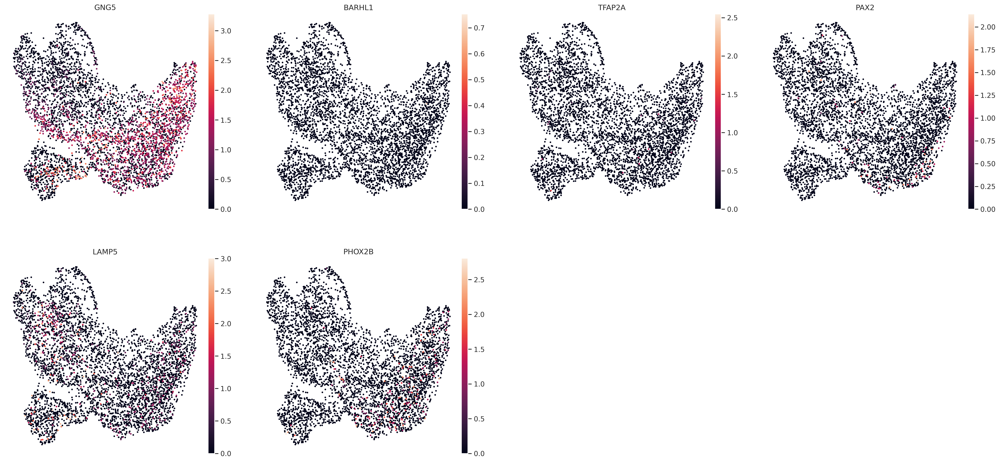

In [61]:
sc.pl.umap(query_adata, color=["GNG5","BARHL1","TFAP2A","PAX2","LAMP5","PHOX2B"])

In [62]:
sc.tl.leiden(query_adata, resolution=0.2, key_added='leiden_res0.2_neurons')

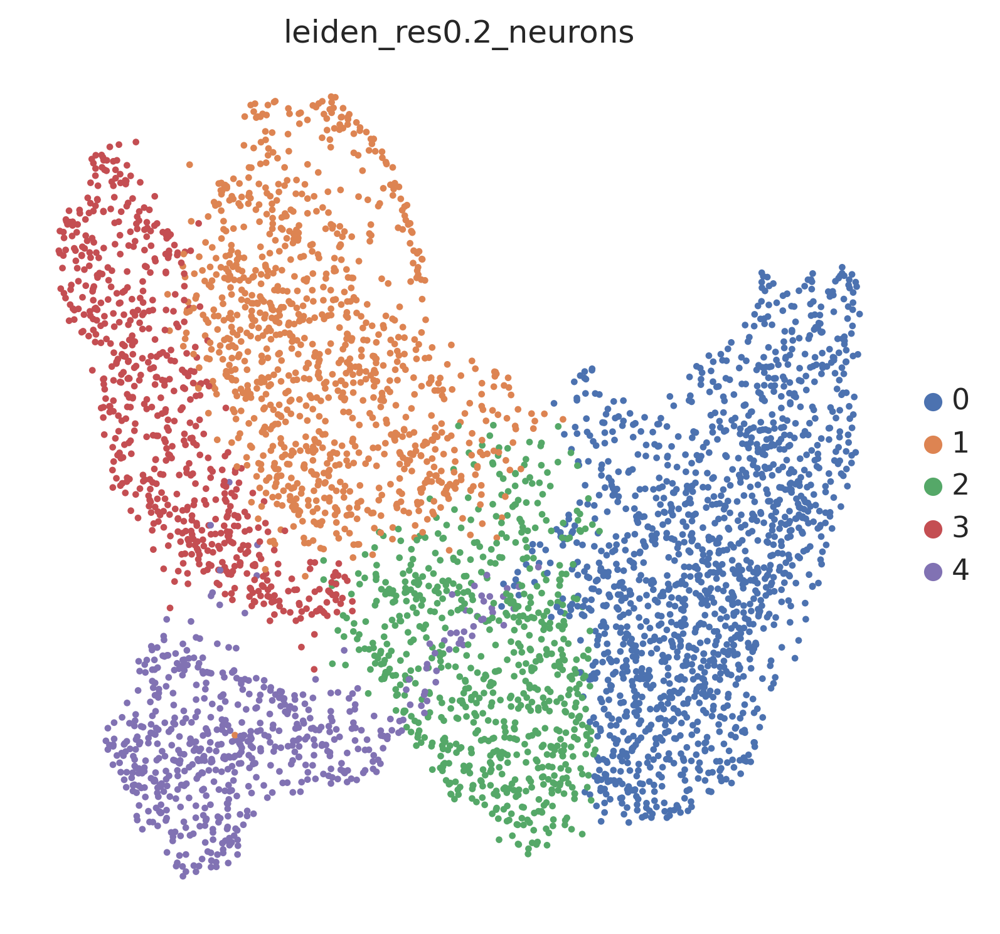

In [63]:
sc.pl.umap(query_adata, color=["leiden_res0.2_neurons"])

In [64]:
sc.tl.rank_genes_groups(query_adata, groupby="leiden_res0.2_neurons")

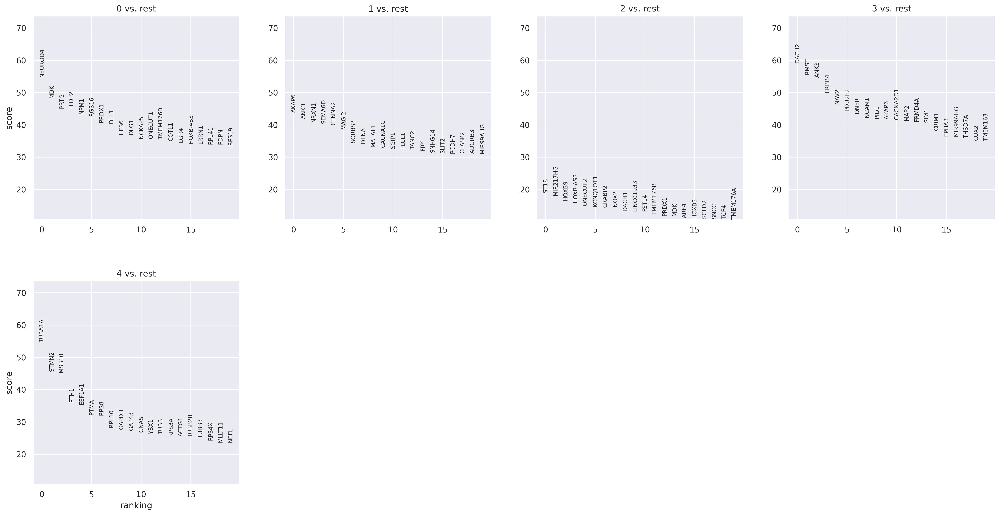

In [65]:
sc.pl.rank_genes_groups(query_adata)

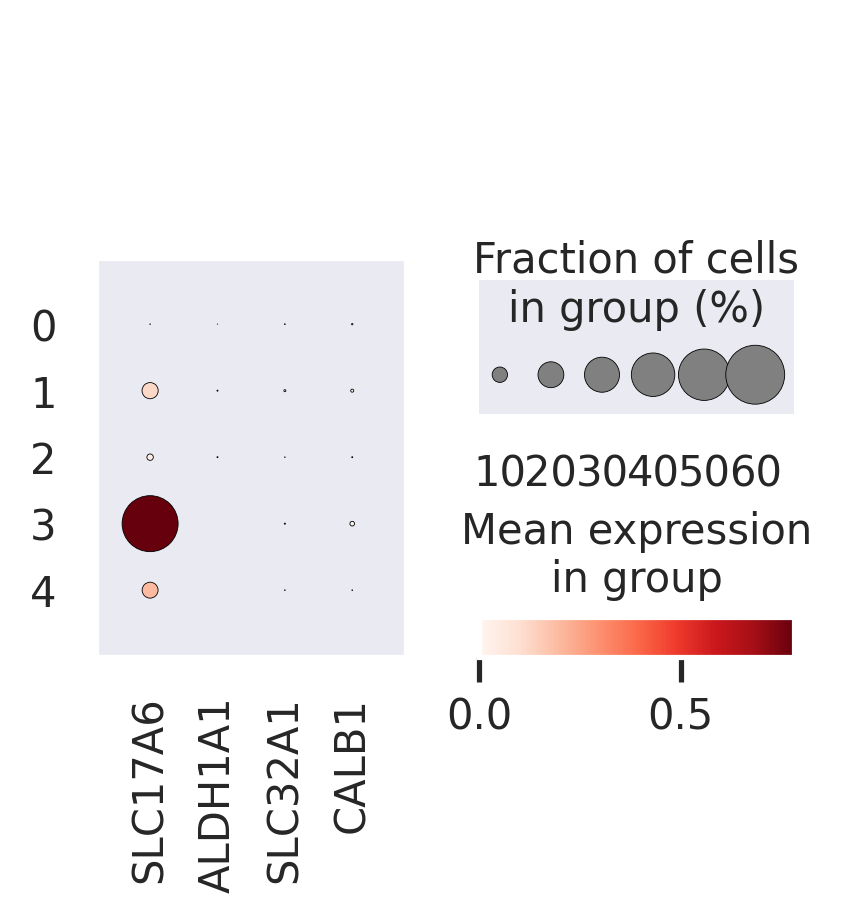

In [72]:
sc.pl.dotplot(query_adata, var_names=["SLC17A6","ALDH1A1","SLC32A1","CALB1"], groupby='leiden_res0.2_neurons')